# 1. Introduction

This project uses the [US accidents dataset](https://www.kaggle.com/sobhanmoosavi/us-accidents) from Kaggle. This dataset contains 1.5 million accident records, which is collected from **February 2016 to Dec 2020** in 49 states of the USA. The author uses multiple APIs provided by the US and state departments of transportation, law enforcement agencies, traffic cameras, and traffic sensors within the road-networks.

There are **30K motor vehicle** crashes yearly in the US, which involves **more than 3K deaths** . From this dataset, we are interested in getting in-depth insights into traffic accidents in the US. We want to visualize the traffic accident data in various methods to present the US traffic accidents cases in a story-telling way, helping audiences to learn about the situations of US traffic accidents. It is also interesting for us to understand the significant factors causing traffic accidents, which might increase our traffic safety awareness in the future.

The main purpose of this project is to study **the key features influencing the occurrence of car accidents**, **the factors affecting accidents severity**, as well as **time and location that have the highest number of accidents**. Finally, we hope to **predict the severity and duration of accidents**. Visualization and modeling will be used to address these purposes.

## Library Import


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import folium
import wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

## Data Input

In [ ]:
prefix = '/content/drive'
from google.colab import drive
drive.mount(prefix, force_remount=True)

Mounted at /content/drive


In [ ]:
traffic_df = pd.read_csv('/content/drive/Shareddrives/545 project/US_Accidents_Dec20_updated.csv')
traffic_df.head()

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Number,Street,Side,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-2716600,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.10891,-83.09286,40.11206,-83.03187,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,NaN,Outerbelt E,R,Dublin,Franklin,OH,43017,US,US/Eastern,KOSU,2016-02-08 00:53:00,42.1,36.1,58.0,29.76,10.0,SW,10.4,0.00,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2716601,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.86542,-84.06280,39.86501,-84.04873,0.747,At OH-4/OH-235/Exit 41 - Accident.,NaN,I-70 E,R,Dayton,Montgomery,OH,45424,US,US/Eastern,KFFO,2016-02-08 05:58:00,36.9,NaN,91.0,29.68,10.0,Calm,NaN,0.02,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night
2,A-2716602,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.10266,-84.52468,39.10209,-84.52396,0.055,At I-71/US-50/Exit 1 - Accident.,NaN,I-75 S,R,Cincinnati,Hamilton,OH,45203,US,US/Eastern,KLUK,2016-02-08 05:53:00,36.0,NaN,97.0,29.70,10.0,Calm,NaN,0.02,Overcast,False,False,False,False,True,False,False,False,False,False,False,False,False,Night,Night,Night,Day
3,A-2716603,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.10148,-84.52341,39.09841,-84.52241,0.219,At I-71/US-50/Exit 1 - Accident.,NaN,US-50 E,R,Cincinnati,Hamilton,OH,45202,US,US/Eastern,KLUK,2016-02-08 05:53:00,36.0,NaN,97.0,29.70,10.0,Calm,NaN,0.02,Overcast,False,False,False,False,True,False,False,False,False,False,False,False,False,Night,Night,Night,Day
4,A-2716604,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.06213,-81.53784,41.06217,-81.53547,0.123,At Dart Ave/Exit 21 - Accident.,NaN,I-77 N,R,Akron,Summit,OH,44311,US,US/Eastern,KAKR,2016-02-08 06:54:00,39.0,NaN,55.0,29.65,10.0,Calm,NaN,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Day,Day


# 2. Explanatory Data Analysis

## 2.1 Data Overview

Let's first take a look at the columns and their datatypes.

In [ ]:
# data type
traffic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1516064 entries, 0 to 1516063
Data columns (total 47 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   ID                     1516064 non-null  object 
 1   Severity               1516064 non-null  int64  
 2   Start_Time             1516064 non-null  object 
 3   End_Time               1516064 non-null  object 
 4   Start_Lat              1516064 non-null  float64
 5   Start_Lng              1516064 non-null  float64
 6   End_Lat                1516064 non-null  float64
 7   End_Lng                1516064 non-null  float64
 8   Distance(mi)           1516064 non-null  float64
 9   Description            1516064 non-null  object 
 10  Number                 469969 non-null   float64
 11  Street                 1516064 non-null  object 
 12  Side                   1516064 non-null  object 
 13  City                   1515981 non-null  object 
 14  County            

There are **1516064** entries with **46** attributes, including 13 bool values, 13 float values, 1 int value and 20 objects. They can be roughly devided into **Time** attributes, **Location** attributes and **Traffic Environment** attributes.



1. **ID**: unique identifier of the accident record.
2. **Severity**: Shows the severity of the accident, a number between **1** and **4**, where 1 indicates the least impact on traffic.

Time

3. **Start_Time**: Shows start time of the accident in local time zone.
4. **End_Time**: Shows end time of the accident in local time zone. End time here refers to when the impact of accident on traffic flow was dismissed.

Location

5. **Start_Lat**: Shows latitude in GPS coordinate of the start point.
6. **Start_Lng**: Shows longitude in GPS coordinate of the start point.
7. **End_Lat**: Shows latitude in GPS coordinate of the end point.
8. **End_Lng**: Shows longitude in GPS coordinate of the end point.
9. **Distance(mi)**: The length of the road extent affected by the accident.
10. **Description**: Shows natural language description of the accident.
11. **Number**: Shows the street number in address record.
12. **Street**: Shows the street name in address record.
13. **Side**: Shows the relative side of the street (Right/Left) in address record.
14. **City**: Shows the city in address record.
15. **County**: Shows the county in address record.
16. **State**: Shows the state in address record.
17. **Zipcode**: Shows the zipcode in address record.
18. **Country**: Shows the country in address record.
19. **Timezone** Shows timezone based on the location of the accident (eastern, central, etc.).

Weather

20. **Airport_Code** Denotes an airport-based weather station which is the closest one to location of the accident.
21. **Weather_Timestamp**: Shows the time-stamp of weather observation record (in local time).
22. **Temperature(F)**: Shows the temperature (in Fahrenheit).
23. **Wind_Chill(F)**: Shows the wind chill (in Fahrenheit).
24. **Humidity(%)**: Shows the humidity (in percentage).
25. **Pressure(in)**: Shows the air pressure (in inches).
26. **Visibility(mi)**: Shows visibility (in miles).
27. **Wind_Direction**: Shows wind direction.
28. **Wind_Speed(mph)**: Shows wind speed (in miles per hour).
29. **Precipitation(in)**: Shows precipitation amount in inches, if there is any.
30. **Weather_Condition**: Shows the weather condition (rain, snow, thunderstorm, fog, etc.)

Traffic environment

31. **Amenity**: A POI annotation which indicates presence of amenity in a nearby location.
32. **Bump**: A POI annotation which indicates presence of speed bump or hump in a nearby location.
33. **Crossing**: A POI annotation which indicates presence of crossing in a nearby location.
34. **Give_Way**: A POI annotation which indicates presence of give_way in a nearby location.
35. **Junction**: A POI annotation which indicates presence of junction in a nearby location.
36. **No_Exit**: A POI annotation which indicates presence of junction in a nearby location.
37. **Railway**: A POI annotation which indicates presence of railway in a nearby location.
38. **Roundabout**: A POI annotation which indicates presence of roundabout in a nearby location.
39. **Station**: A POI annotation which indicates presence of station in a nearby location.
40. **Stop**: A POI annotation which indicates presence of stop in a nearby location.
41. **Traffic_Calming**: A POI annotation which indicates presence of traffic_calming in a nearby location.
42. **Traffic_Signal**: A POI annotation which indicates presence of traffic_signal in a nearby location.
43. **Turning_Loop**: A POI annotation which indicates presence of turning_loop in a nearby location.
44. **Sunrise_Sunset**: Shows the period of day (i.e. day or night) based on sunrise/sunset.
45. **Civil_Twilight**: Shows the period of day (i.e. day or night) based on civil twilight.
46. **Nautical_Twilight**: Shows the period of day (i.e. day or night) based on nautical twilight.
47. **Astronomical_Twilight**: Shows the period of day (i.e. day or night) based on astronomical twilight.

Then, let's check the null values

In [ ]:
# check null values
traffic_df.isnull().sum()

ID                             0
Severity                       0
Start_Time                     0
End_Time                       0
Start_Lat                      0
Start_Lng                      0
End_Lat                        0
End_Lng                        0
Distance(mi)                   0
Description                    0
Number                   1046095
Street                         0
Side                           0
City                          83
County                         0
State                          0
Zipcode                      935
Country                        0
Timezone                    2302
Airport_Code                4248
Weather_Timestamp          30264
Temperature(F)             43033
Wind_Chill(F)             449316
Humidity(%)                45509
Pressure(in)               36274
Visibility(mi)             44211
Wind_Direction             41858
Wind_Speed(mph)           128862
Precipitation(in)         510549
Weather_Condition          44007
Amenity   

There are NULL values in location attributes as well as whether conditions. **Street Number, Wind_Chill and Precipitation** contains huge amount of NULLs. They are not that important so we can consider just removing these columns. As for other attributes, it's reasonable to do dropna. Since we have 1.5M rows, we'll still have more than 1M tuples after dropping 128k NULLs from Wind_Speed. It's more convinenet to do modeling without NULL values in the features.

Finally, let's check the distribution of numerical columns

In [ ]:
# stats
traffic_df.describe()

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Number,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,1.516064e+06,1.516064e+06,1.516064e+06,1.516064e+06,1.516064e+06,1.516064e+06,4.699690e+05,1.473031e+06,1.066748e+06,1.470555e+06,1.479790e+06,1.471853e+06,1.387202e+06,1.005515e+06
mean,2.238630e+00,3.690056e+01,-9.859919e+01,3.690061e+01,-9.859901e+01,5.872617e-01,8.907533e+03,5.958460e+01,5.510976e+01,6.465960e+01,2.955495e+01,9.131755e+00,7.630812e+00,8.477855e-03
std,6.081481e-01,5.165653e+00,1.849602e+01,5.165629e+00,1.849590e+01,1.632659e+00,2.242190e+04,1.827316e+01,2.112735e+01,2.325986e+01,1.016756e+00,2.889112e+00,5.637364e+00,1.293168e-01
min,1.000000e+00,2.457022e+01,-1.244976e+02,2.457011e+01,-1.244978e+02,0.000000e+00,0.000000e+00,-8.900000e+01,-8.900000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.000000e+00,3.385422e+01,-1.182076e+02,3.385420e+01,-1.182077e+02,0.000000e+00,1.212000e+03,4.700000e+01,4.080000e+01,4.800000e+01,2.944000e+01,1.000000e+01,4.600000e+00,0.000000e+00
50%,2.000000e+00,3.735113e+01,-9.438100e+01,3.735134e+01,-9.437987e+01,1.780000e-01,4.000000e+03,6.100000e+01,5.700000e+01,6.800000e+01,2.988000e+01,1.000000e+01,7.000000e+00,0.000000e+00
75%,2.000000e+00,4.072593e+01,-8.087469e+01,4.072593e+01,-8.087449e+01,5.940000e-01,1.010000e+04,7.300000e+01,7.100000e+01,8.400000e+01,3.004000e+01,1.000000e+01,1.040000e+01,0.000000e+00
max,4.000000e+00,4.900058e+01,-6.711317e+01,4.907500e+01,-6.710924e+01,1.551860e+02,9.999997e+06,1.706000e+02,1.130000e+02,1.000000e+02,5.804000e+01,1.400000e+02,9.840000e+02,2.400000e+01


Precipitation(in) has weird stats. min, 25%, 50% and 75% are all 0. This is due to huge amount of NULL values, so apprently we need to drop them.

## 2.2 Data Cleaning

Now it's time to clean the data. First things first, let's drop useless columns and do dropna on other columns.

**ID**: We're not doing merge or joins so not useful.

**Country**: Every case is in US.

**Number, Wind_Chill(F), Precipitation(in)**: Too many NULLs.


In [ ]:
# drop useless columns (ID, Country), and those with too many NULLs (Number, Wind_Chill(F), Precipitation(in))
traffic_df.drop(columns=['ID', 'Number', 'Wind_Chill(F)', 'Precipitation(in)', 'Country'], inplace=True)

In [ ]:
# drop NULLs in other columns
traffic_df = traffic_df.dropna().reset_index().drop(columns=['index'])

Secondly, convert Start_Time and End_Time to datetime so that we can extract time information. Let's create a new df and store info like years and month in new columns. Also, convert True/False columns to 1/0. This df will be used in the modeling section.

In [ ]:
# correct datetime type
traffic_df['Start_Time'] = pd.to_datetime(traffic_df['Start_Time'])
traffic_df['End_Time'] = pd.to_datetime(traffic_df['End_Time'])

In [ ]:
# replace true/fase into 1/0
traffic_df_1 = traffic_df
traffic_df_1[['Amenity','Crossing','Give_Way','Bump','Junction','No_Exit','Railway','Roundabout','Station','Stop','Traffic_Signal','Turning_Loop','Traffic_Calming']] = (traffic_df_1[['Amenity','Crossing','Give_Way','Bump','Junction','No_Exit','Railway','Roundabout','Station','Stop','Traffic_Signal','Turning_Loop','Traffic_Calming']]).astype(int)


In [ ]:
# Break down date into Year, Month, Day, Time
traffic_df_1['Start_Time_Year'] = pd.to_datetime(traffic_df_1['Start_Time']).dt.year
traffic_df_1['Start_Time_Month'] = pd.to_datetime(traffic_df_1['Start_Time']).dt.month
traffic_df_1['Start_Time_Day'] = pd.to_datetime(traffic_df_1['Start_Time']).dt.day
traffic_df_1['Start_Time_Hour'] = pd.to_datetime(traffic_df_1['Start_Time']).dt.hour
traffic_df_1['Start_Time_DayofWeek'] = pd.to_datetime(traffic_df_1['Start_Time']).dt.dayofweek
traffic_df_1

,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Street,Side,City,County,State,Zipcode,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Start_Time_Year,Start_Time_Month,Start_Time_Day,Start_Time_Hour,Start_Time_DayofWeek
0,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,Outerbelt E,R,Dublin,Franklin,OH,43017,US/Eastern,KOSU,2016-02-08 00:53:00,42.1,58.0,29.76,10.0,SW,10.4,Light Rain,0,0,0,0,0,0,0,0,0,0,0,0,0,Night,Night,Night,Night,2016,2,8,0,0
1,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500,At Mitchell Ave/Exit 6 - Accident.,I-75 S,R,Cincinnati,Hamilton,OH,45217,US/Eastern,KLUK,2016-02-08 07:53:00,37.0,93.0,29.69,10.0,WSW,10.4,Light Rain,0,0,0,0,0,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2016,2,8,7,0
2,2,2016-02-08 08:16:57,2016-02-08 14:16:57,39.063240,-84.032430,39.067310,-84.058510,1.427,At Dela Palma Rd - Accident.,State Route 32,R,Williamsburg,Clermont,OH,45176,US/Eastern,KI69,2016-02-08 08:16:00,35.6,100.0,29.66,10.0,WSW,8.1,Overcast,0,0,0,0,0,0,0,0,0,0,0,1,0,Day,Day,Day,Day,2016,2,8,8,0
3,2,2016-02-08 08:16:57,2016-02-08 14:16:57,39.067080,-84.058550,39.063020,-84.032540,1.423,At Dela Palma Rd - Accident.,State Route 32,R,Batavia,Clermont,OH,45103,US/Eastern,KI69,2016-02-08 08:16:00,35.6,100.0,29.66,10.0,WSW,8.1,Overcast,0,0,0,0,0,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2016,2,8,8,0
4,2,2016-02-08 08:15:41,2016-02-08 14:15:41,39.775650,-84.186030,39.772750,-84.188050,0.227,At OH-4/Exit 54 - Accident.,I-75 S,R,Dayton,Montgomery,OH,45404,US/Eastern,KFFO,2016-02-08 08:18:00,33.8,100.0,29.63,3.0,SW,2.3,Mostly Cloudy,0,0,0,0,0,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2016,2,8,8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1370975,2,2019-08-23 18:03:25,2019-08-23 18:32:01,34.002480,-117.379360,33.998880,-117.370940,0.543,At Market St - Accident.,Pomona Fwy E,R,Riverside,Riverside,CA,92501,US/Pacific,KRAL,2019-08-23 17:53:00,86.0,40.0,28.92,10.0,W,13.0,Fair,0,0,0,0,0,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2019,8,23,18,4
1370976,2,2019-08-23 19:11:30,2019-08-23 19:38:23,32.766960,-117.148060,32.765550,-117.153630,0.338,At Camino Del Rio/Mission Center Rd - Accident.,I-8 W,R,San Diego,San Diego,CA,92108,US/Pacific,KMYF,2019-08-23 18:53:00,70.0,73.0,29.39,10.0,SW,6.0,Fair,0,0,0,0,0,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2019,8,23,19,4
1370977,2,2019-08-23 19:00:21,2019-08-23 19:28:49,33.775450,-117.847790,33.777400,-117.857270,0.561,At Glassell St/Grand Ave - Accident. in the ri...,Garden Grove Fwy,R,Orange,Orange,CA,92866,US/Pacific,KSNA,2019-08-23 18:53:00,73.0,64.0,29.74,10.0,SSW,10.0,Partly Cloudy,0,0,0,0,1,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2019,8,23,19,4
1370978,2,2019-08-23 19:00:21,2019-08-23 19:29:42,33.992460,-118.403020,33.983110,-118.395650,0.772,At CA-90/Marina Fwy/Jefferson Blvd - Accident.,San Diego Fwy S,R,Culver City,Los Angeles,CA,90230,US/Pacific,KSMO,2019-08-23 18:51:00,71.0,81.0,29.62,10.0,SW,8.0,Fair,0,0,0,0,0,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2019,8,23,19,4


In [ ]:
traffic_df.head()

,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Street,Side,City,County,State,Zipcode,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Start_Time_Year,Start_Time_Month,Start_Time_Day,Start_Time_Hour,Start_Time_DayofWeek
0,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,Outerbelt E,R,Dublin,Franklin,OH,43017,US/Eastern,KOSU,2016-02-08 00:53:00,42.1,58.0,29.76,10.0,SW,10.4,Light Rain,0,0,0,0,0,0,0,0,0,0,0,0,0,Night,Night,Night,Night,2016,2,8,0,0
1,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500,At Mitchell Ave/Exit 6 - Accident.,I-75 S,R,Cincinnati,Hamilton,OH,45217,US/Eastern,KLUK,2016-02-08 07:53:00,37.0,93.0,29.69,10.0,WSW,10.4,Light Rain,0,0,0,0,0,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2016,2,8,7,0
2,2,2016-02-08 08:16:57,2016-02-08 14:16:57,39.063240,-84.032430,39.067310,-84.058510,1.427,At Dela Palma Rd - Accident.,State Route 32,R,Williamsburg,Clermont,OH,45176,US/Eastern,KI69,2016-02-08 08:16:00,35.6,100.0,29.66,10.0,WSW,8.1,Overcast,0,0,0,0,0,0,0,0,0,0,0,1,0,Day,Day,Day,Day,2016,2,8,8,0
3,2,2016-02-08 08:16:57,2016-02-08 14:16:57,39.067080,-84.058550,39.063020,-84.032540,1.423,At Dela Palma Rd - Accident.,State Route 32,R,Batavia,Clermont,OH,45103,US/Eastern,KI69,2016-02-08 08:16:00,35.6,100.0,29.66,10.0,WSW,8.1,Overcast,0,0,0,0,0,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2016,2,8,8,0
4,2,2016-02-08 08:15:41,2016-02-08 14:15:41,39.775650,-84.186030,39.772750,-84.188050,0.227,At OH-4/Exit 54 - Accident.,I-75 S,R,Dayton,Montgomery,OH,45404,US/Eastern,KFFO,2016-02-08 08:18:00,33.8,100.0,29.63,3.0,SW,2.3,Mostly Cloudy,0,0,0,0,0,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2016,2,8,8,0


In [ ]:
traffic_df.isnull().sum()

Severity                 0
Start_Time               0
End_Time                 0
Start_Lat                0
Start_Lng                0
End_Lat                  0
End_Lng                  0
Distance(mi)             0
Description              0
Street                   0
Side                     0
City                     0
County                   0
State                    0
Zipcode                  0
Timezone                 0
Airport_Code             0
Weather_Timestamp        0
Temperature(F)           0
Humidity(%)              0
Pressure(in)             0
Visibility(mi)           0
Wind_Direction           0
Wind_Speed(mph)          0
Weather_Condition        0
Amenity                  0
Bump                     0
Crossing                 0
Give_Way                 0
Junction                 0
No_Exit                  0
Railway                  0
Roundabout               0
Station                  0
Stop                     0
Traffic_Calming          0
Traffic_Signal           0
T

No NULLs remain in the original dataframe. We're good to go!

## 2.3 Data Analysis

We're done on data cleaning, now it's time to ask some questions: how's severity distributed? Which places have most accident cases? When is the time that accidents occur most frequently?

### 2.3.1 Distribution of Severity

The severity of accidents is a number between **1** and **4**, where 1 indicates the least impact on traffic and 4 indicates the most severe cases. The first thing we want to know is which one has the highest percentage?

In [ ]:
severity_counts_df = pd.DataFrame(traffic_df['Severity'].value_counts())
severity_counts_df['Percentage'] = severity_counts_df['Severity'] / sum(severity_counts_df["Severity"]) * 100

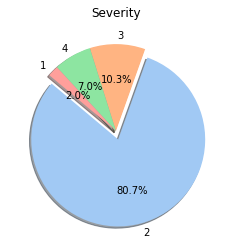

In [ ]:
#@title How is severity distributed over all accidents?
#@markdown Pie plot
colors = sns.color_palette('pastel')[0:4]
data = list(severity_counts_df['Percentage'])
labels = list(severity_counts_df.index)
plt.pie(data, labels = labels, colors = colors, autopct='%1.1f%%', explode=(0.1, 0, 0, 0), shadow=True, startangle=140)
plt.title("Severity")
plt.show()

Most of the accidents have severity **2**, severity **3** takes second place. This makes sense since most of the accidents are moderate and only a few are severe. Also, many accidents with the least impact may not be recorded so there're only 2% cases have severity 1. 

However, the imbalance in the distribution of severity may influence the accuracy of prediction. We may want to consider unsampling some severity 2 cases to improve the performance of our model.

### 2.3.2 State analysis

The next question that is very natural to ask is which states are dangerous/safe in terms of traffic accidents?

In [ ]:
# Which state has most accidents?
state_counts_df = traffic_df.groupby(by=['State']).count().reset_index()[['State', 'Start_Time']]
state_counts_df.rename(columns={"Start_Time": "Accidents Cases"}, inplace=True)
state_counts_df.sort_values(by=['Accidents Cases'], ascending=False, inplace=True)

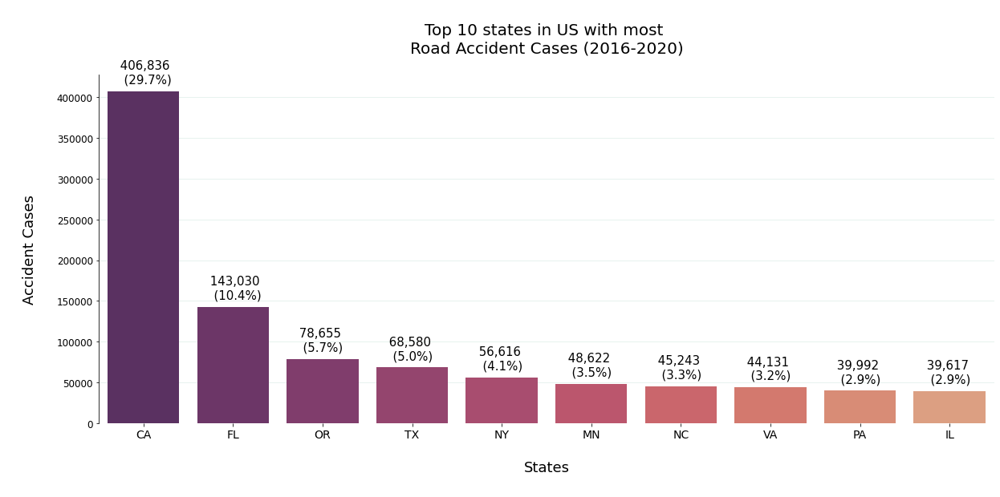

In [ ]:
#@title Top 10 states with most accident cases
#@markdown Bar plot
# set plot
plt.figure(figsize=(20,8))
plt.xticks(fontsize=14)
plt.yticks(fontsize=12)
plt.title('\nTop 10 states in US with most \nRoad Accident Cases (2016-2020)\n', size=20, color='Black')
# set color
palette = sns.color_palette("flare", n_colors=10)
palette.reverse()
# set barplot
ax = sns.barplot(x="State", y="Accidents Cases", data=state_counts_df.head(10), dodge=True, palette=palette)
# calculate percentage
total = traffic_df.shape[0]
for i in ax.patches:
    ax.text(i.get_x()+0.1, i.get_height()+10000, \
            ' {:,d}\n  ({}%) '.format(int(i.get_height()), round(100*i.get_height()/total, 1)), fontsize=15,
                color='black')
ax.set_axisbelow(True)
right_side = ax.spines["right"]
right_side.set_visible(False)
top_side = ax.spines["top"]
top_side.set_visible(False)
bottom_side = ax.spines["bottom"]
bottom_side.set_visible(False)
ax.grid(color='#b2d6c7', linewidth=1, axis='y', alpha=.3)
ax.set_xlabel('\nStates\n', fontsize=18, color='Black')
ax.set_ylabel('\nAccident Cases\n', fontsize=18, color='Black')
plt.show()

In the past 5 years, **California** has most accidents (about 30% of all cases) in US. **Florida** takes the second place but CA is much ahead of it. This result is not surprising, since they are among the most popular tourism states and there are lots of floating population.

Among the top 10 states with most accident cases, do they tend to have more severe cases?

In [ ]:
# How's severity distributed over these 10 states?
state_severity_counts_df = traffic_df.groupby(by=['State', 'Severity']).count().reset_index()[['State','Severity', 'Start_Time']]
state_severity_counts_df.rename(columns={"Start_Time": "Accidents Cases"}, inplace=True)
top10_states = list(state_counts_df.head(10)['State'])
state_severity_counts_df = state_severity_counts_df[state_severity_counts_df['State'].isin(top10_states)]
cases_1 = list(state_severity_counts_df[state_severity_counts_df['Severity'] == 1]['Accidents Cases'])
cases_2 = list(state_severity_counts_df[state_severity_counts_df['Severity'] == 2]['Accidents Cases'])
cases_3 = list(state_severity_counts_df[state_severity_counts_df['Severity'] == 3]['Accidents Cases'])
cases_4 = list(state_severity_counts_df[state_severity_counts_df['Severity'] == 4]['Accidents Cases'])
States = list(state_severity_counts_df[state_severity_counts_df['Severity'] == 4]['State'])
state_severity_df = pd.DataFrame({'State': States,
     '1': cases_1,
     '2': cases_2,
     '3': cases_3,
     '4': cases_4,
    })
state_severity_df = state_severity_df.reindex([2, 7, 9, 4, 3, 5, 8, 6, 1, 0])

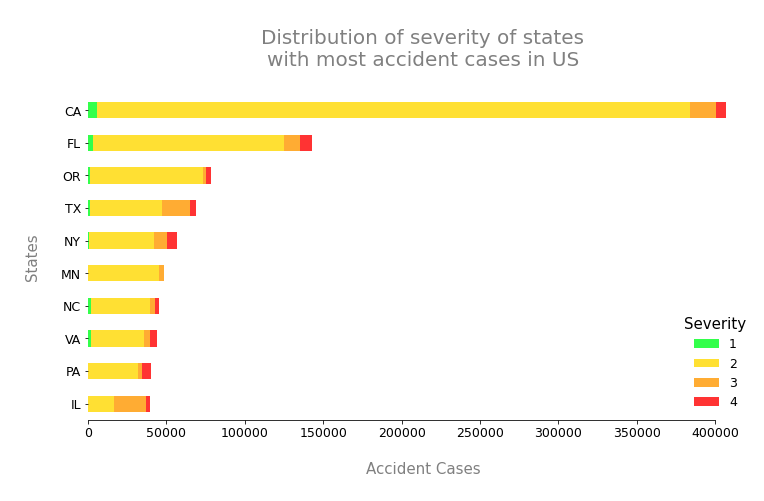

In [ ]:
#@title Distribution of severity in top 10 states
#@markdown Stacked plot
ax = state_severity_df.plot(kind='barh', x="State",  stacked=True, figsize=(12, 6), rot=0, color=['#33FF4B', '#FFE033', '#FFAC33', '#FF3333']);
ax.set_title('\nDistribution of severity of states\nwith most accident cases in US\n', fontsize=20, color='grey');

for i in ['top', 'left', 'right']:
    side = ax.spines[i]
    side.set_visible(False)
    
ax.spines['bottom'].set_bounds(0, 400000);
ax.set_ylabel('\nStates\n', fontsize=15, color='grey');
ax.set_xlabel('\nAccident Cases\n', fontsize=15, color='grey');
ax.legend(prop={'size': 12.5}, loc='best', fancybox = True, title="Severity", title_fontsize=15, edgecolor='white');
ax.tick_params(axis='both', which='major', labelsize=12.5)

Again, accidents with severity 2 take the majority. States that have most accident cases such as CA and FL also have a many accidents with severity 4. Besides, cases with severity 3 takes a relativly high portion in TX and IL.

Are there other states with many severe cases?

In [ ]:
# Which state has most severity 4 Cases?
state_severity_counts3_df = traffic_df.groupby(by=['State', 'Severity']).count().reset_index()[['State','Severity', 'Start_Time']]
state_severity_counts3_df = state_severity_counts3_df[state_severity_counts3_df['Severity'] == 4]
state_severity_counts3_df.rename(columns={"Start_Time": "Cases"}, inplace=True)
state_severity_counts3_df.sort_values(by=['Cases'], ascending=False, inplace=True)

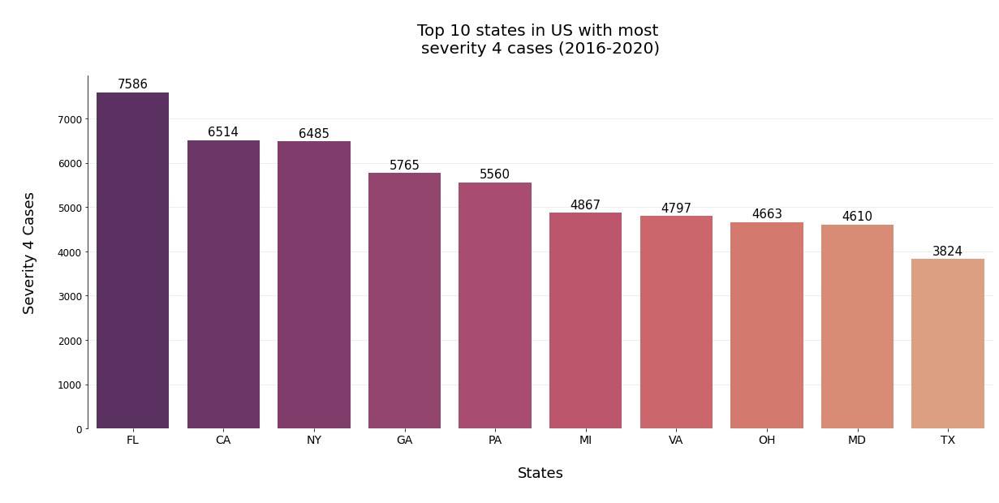

In [ ]:
#@title Top 10 states with most severity 4 cases
#@markdown Bar plot
# set plot
plt.figure(figsize=(20,8))
plt.xticks(fontsize=14)
plt.yticks(fontsize=12)
plt.title('\nTop 10 states in US with most \nseverity 4 cases (2016-2020)\n', size=20, color='Black')
# set color
palette = sns.color_palette("flare", n_colors=10)
palette.reverse()
# set barplot
ax = sns.barplot(x="State", y="Cases", data=state_severity_counts3_df.head(10), dodge=True, palette=palette)

for p in ax.patches:
            _x = p.get_x() + p.get_width() / 2
            _y = p.get_y() + p.get_height() + 100
            value = '{}'.format(int(p.get_height()))
            ax.text(_x, _y, value, ha="center", fontsize=15,)

ax.set_axisbelow(True)
right_side = ax.spines["right"]
right_side.set_visible(False)
top_side = ax.spines["top"]
top_side.set_visible(False)
bottom_side = ax.spines["bottom"]
bottom_side.set_visible(False)
ax.grid(color='#b2d6c7', linewidth=1, axis='y', alpha=.3)
ax.set_xlabel('\nStates\n', fontsize=18, color='Black')
ax.set_ylabel('\nSeverity 4 Cases\n', fontsize=18, color='Black')
plt.show()

FL and CA have most severity 4 accident cases, due to the high number of total cases. Suprisingly, **GA, MI, OH and MD** are not among top 10 states with most total cases, yet they still have a lot severe accidents over the past 5 years.

Apparently states with more accidents tend to have more sever cases. So we want to look at which state have most percentage of severity 4 cases.

In [ ]:
# Which state has most severity 4 accidents (with respect to the total cases of that state)?
state_severity_counts2_df = traffic_df.groupby(by=['State', 'Severity']).count().reset_index()[['State','Severity', 'Start_Time']]
state_severity_counts2_df = state_severity_counts2_df[state_severity_counts2_df['Severity'] == 4]
state_severity_counts2_df = state_severity_counts2_df.merge(state_counts_df, left_on="State", right_on="State")
state_severity_counts2_df.rename(columns={"Start_Time": "Cases", "Accidents Cases": "Total Cases"}, inplace=True)
state_severity_counts2_df['Percentage'] = state_severity_counts2_df['Cases'] / state_severity_counts2_df['Total Cases']
state_severity_counts2_df.sort_values(by=['Percentage'], ascending=False, inplace=True)

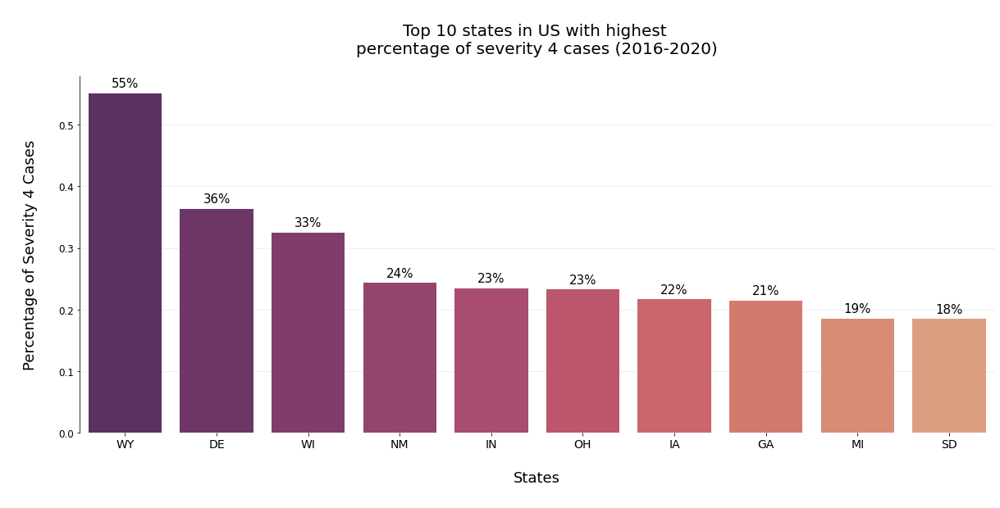

In [ ]:
#@title Top 10 states with highest percentage of severity 4 cases
#@markdown Bar plot
# set plot
plt.figure(figsize=(20,8))
plt.xticks(fontsize=14)
plt.yticks(fontsize=12)
plt.title('\nTop 10 states in US with highest \npercentage of severity 4 cases (2016-2020)\n', size=20, color='Black')
# set color
palette = sns.color_palette("flare", n_colors=10)
palette.reverse()
# set barplot
ax = sns.barplot(x="State", y="Percentage", data=state_severity_counts2_df.head(10), dodge=True, palette=palette)

for p in ax.patches:
            _x = p.get_x() + p.get_width() / 2
            _y = p.get_y() + p.get_height() + 0.01
            value = '{}%'.format(round(100*p.get_height()))
            ax.text(_x, _y, value, ha="center", fontsize=15,)

ax.set_axisbelow(True)
right_side = ax.spines["right"]
right_side.set_visible(False)
top_side = ax.spines["top"]
top_side.set_visible(False)
bottom_side = ax.spines["bottom"]
bottom_side.set_visible(False)
ax.grid(color='#b2d6c7', linewidth=1, axis='y', alpha=.3)
ax.set_xlabel('\nStates\n', fontsize=18, color='Black')
ax.set_ylabel('\nPercentage of Severity 4 Cases\n', fontsize=18, color='Black')
plt.show()

In **Wyoming**, more than 50% of traffic accidents have severity 4 in the past 5 years. This is horrible.

Phew..these numbers are shocking! Let's in turn check the safest states.

In [ ]:
# Which states are safest?
state_counts_df.sort_values(by=['Accidents Cases'], ascending=True, inplace=True)

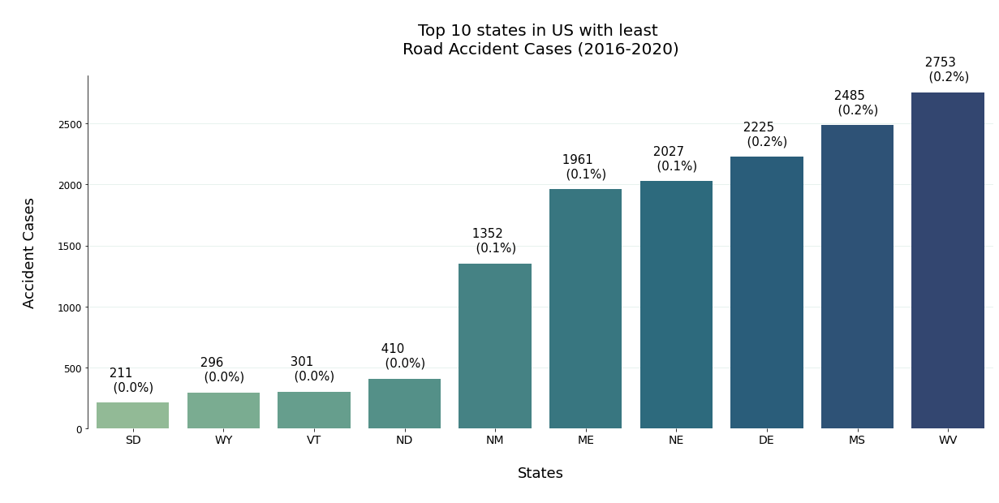

In [ ]:
#@title Top 10 states with least accident cases
#@markdown Bar plot
# set plot
plt.figure(figsize=(20,8))
plt.xticks(fontsize=14)
plt.yticks(fontsize=12)
plt.title('\nTop 10 states in US with least \nRoad Accident Cases (2016-2020)\n', size=20, color='Black')
# set color
palette = sns.color_palette("crest", n_colors=10)
# set barplot
ax = sns.barplot(x="State", y="Accidents Cases", data=state_counts_df.head(10), dodge=True, palette=palette)
# calculate percentage
total = traffic_df.shape[0]
for i in ax.patches:
    ax.text(i.get_x()+0.1, i.get_height()+100, \
            ' {}\n  ({}%) '.format(int(i.get_height()), round(100*i.get_height()/total, 1)), fontsize=15,
                color='black')
ax.set_axisbelow(True)
right_side = ax.spines["right"]
right_side.set_visible(False)
top_side = ax.spines["top"]
top_side.set_visible(False)
bottom_side = ax.spines["bottom"]
bottom_side.set_visible(False)
ax.grid(color='#b2d6c7', linewidth=1, axis='y', alpha=.3)
ax.set_xlabel('\nStates\n', fontsize=18, color='Black')
ax.set_ylabel('\nAccident Cases\n', fontsize=18, color='Black')
plt.show()

**SD, WY, VT and ND** only have less than 500 accidents over the past 5 years. That's really few. However, in the last part we saw **WY** has the highest percentage of severity 4, so it should not be considered very safe.

### 2.3.3 City analysis

Now let's zoom in a little bit to check the stats of cities. Which cities have the highest number of cases?

In [ ]:
# Which cities have most accidents?
city_counts_df = traffic_df.groupby(by=['City']).count().reset_index()[['City', 'Start_Time']]
city_counts_df.rename(columns={"Start_Time": "Accidents Cases"}, inplace=True)
city_counts_df.sort_values(by=['Accidents Cases'], ascending=False, inplace=True)

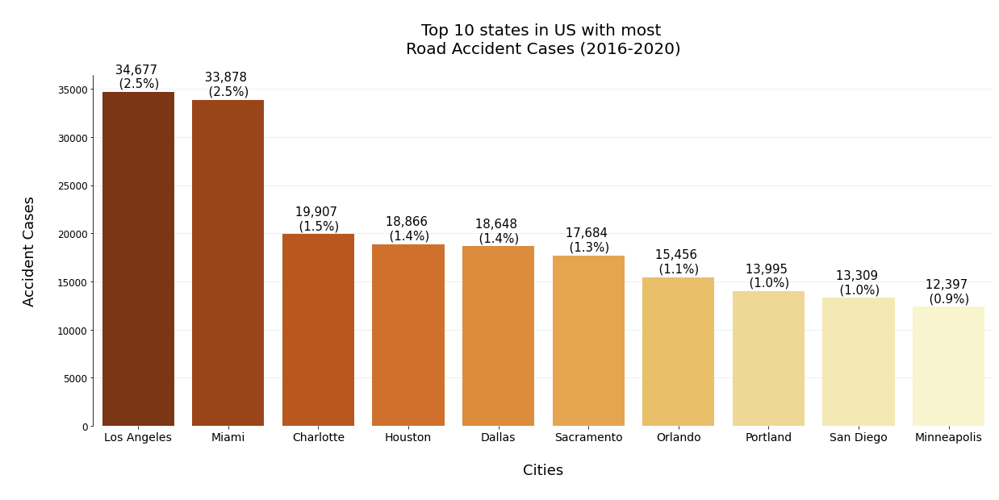

In [ ]:
#@title Top 10 cities with most accident cases
#@markdown Bar plot
# set plot
plt.figure(figsize=(20,8))
plt.xticks(fontsize=14)
plt.yticks(fontsize=12)
plt.title('\nTop 10 states in US with most \nRoad Accident Cases (2016-2020)\n', size=20, color='Black')
# set color
palette = sns.color_palette("YlOrBr", n_colors=10)
palette.reverse()
# set barplot
ax = sns.barplot(x="City", y="Accidents Cases", data=city_counts_df.head(10), dodge=False, palette=palette)
# calculate percentage
total = traffic_df.shape[0]
for i in ax.patches:
    ax.text(i.get_x()+0.1, i.get_height()+500, \
            ' {:,d}\n  ({}%) '.format(int(i.get_height()), round(100*i.get_height()/total, 1)), fontsize=15,
                color='black')
ax.set_axisbelow(True)
right_side = ax.spines["right"]
right_side.set_visible(False)
top_side = ax.spines["top"]
top_side.set_visible(False)
bottom_side = ax.spines["bottom"]
bottom_side.set_visible(False)
ax.grid(color='#b2d6c7', linewidth=1, axis='y', alpha=.3)
ax.set_xlabel('\nCities\n', fontsize=18, color='Black')
ax.set_ylabel('\nAccident Cases\n', fontsize=18, color='Black')
plt.show()

No surprice. The high numbers in **LA, Miami and Orlando** explaines the cases in CA and FL. After all, who can say no to Disneyland and Universal Studio?

We further use Plotly to visualize cases of cities on US map. This helps us to check what regions tend to have more cases.

In [ ]:
# Visualize city accident cases on US map
map_city_df = traffic_df.groupby(by=['City']).mean().reset_index()[['City', 'Start_Lat', 'Start_Lng']]
map_city_df = map_city_df.merge(city_counts_df, left_on='City', right_on='City')

In [ ]:
#@title Accident cases of cities on US map
#@markdown visualize on US map
map_city_df['text'] = map_city_df['City'] + '<br>Accident cases: ' + (map_city_df['Accidents Cases']).astype(str)
limits = [(0,100),(101,1000),(1001,5000),(5001,10000),(10001,50000)]
colors = ["lightgrey", "lightseagreen", "royalblue", "orange", "crimson"]
cities = []
scale = 50

fig = go.Figure()

for i in range(len(limits)):
    lim = limits[i]
    df_sub = map_city_df[(map_city_df['Accidents Cases']>=lim[0]) & (map_city_df['Accidents Cases']<=lim[1])]
    fig.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = df_sub['Start_Lng'],
        lat = df_sub['Start_Lat'],
        text = df_sub['text'],
        marker = dict(
            size = df_sub['Accidents Cases']/scale,
            color = colors[i],
            line_color='rgb(40,40,40)',
            line_width=0.5,
            sizemode = 'area'
        ),
        name = '{0} - {1}'.format(lim[0],lim[1])))

fig.update_layout(
        title_text = 'Accident cases of US cities (2016-2020)<br>(Click legend to toggle traces)',
        showlegend = True,
        geo = dict(
            scope = 'usa',
            landcolor = 'rgb(217, 217, 217)',
        )
    )

fig.show()

Although several big cities on west coast have many cases, such as LA, Sacramento and Portland, obviously the situation on east coast is worse. No wonder people say East Coast drivers are more aggressive than West Coast drivers (Just kidding).

Now we focus on the accidents in Philadelphia specifically, and do visualization on the map to see which part of Philadelphia is more likely to have accidents.

In [ ]:
phi_df = traffic_df[traffic_df['City'] == 'Philadelphia']

In [ ]:
#@title Accidents in Philadelphia area
#@markdown Visualize on Philly Map
import folium.plugins

phi_lat = 39.952583
phi_long = -75.165222

phi_map = folium.Map(location=[phi_lat, phi_long], zoom_start=12)

# Instantiate a mark cluster object for the incidents in the dataframe
accidents = folium.plugins.MarkerCluster().add_to(phi_map)

# Loop through the dataframe and add each data point to the mark cluster
for lat, lng, label in zip(phi_df['Start_Lat'], phi_df['Start_Lng'], phi_df['Severity'].astype(str)):
    if label == '4':
        folium.Marker(location=[lat, lng], icon=folium.Icon(color="red", icon="warning-sign"),popup=label,).add_to(accidents)
    elif label == '3':
        folium.Marker(location=[lat, lng], icon=folium.Icon(color="lightred", icon="warning-sign"), popup=label,).add_to(accidents)
    elif label == '2':
        folium.Marker(location=[lat, lng], icon=folium.Icon(color="orange", icon="warning-sign"), popup=label,).add_to(accidents)
    elif label == '1':
        folium.Marker(location=[lat, lng], icon=folium.Icon(color="beige", icon="warning-sign"), popup=label,).add_to(accidents)
# Display map
phi_map

The above plot is an interatctive plot of the accidents in Philadelphia where you can zoom in and out. There are a bunch of circles in color, while the color orange means a large number of accidents, while green means small. 

If you keep clicking on the circles, you will finally got some warning signs, and these signs are the exact locations of accidents. The color of the warning signs means the severity, where the red means the most severe accidents, and green means least.

In [ ]:
#@title Severity of accidents in Philadelphia area
#@markdown Density Map Plot
import plotly.express as px
fig = px.density_mapbox(phi_df, lat='Start_Lat', lon='Start_Lng', z='Severity', hover_name='Street', radius=5,
                        center=dict(lat=phi_lat, lon=phi_long), zoom=12,
                        mapbox_style="open-street-map", height=900)

fig.show()

The above plot is a density map plot, where the color means average severity of accidents. Yellow means the most severe and purple means the least severe.

From the plot, the accidents mainly located in center city and east philly. There are lots of severe cases on I-676, I-76 and I-95. Therefore, this analysis can help informing drivers about the dangerous road part.

### 2.3.3 Time analysis

Let's switch to time analysis. When are the accidents most likely to happen?

To start with, since our dataset contains cases in the past 5 years, we want to check how they are distributed

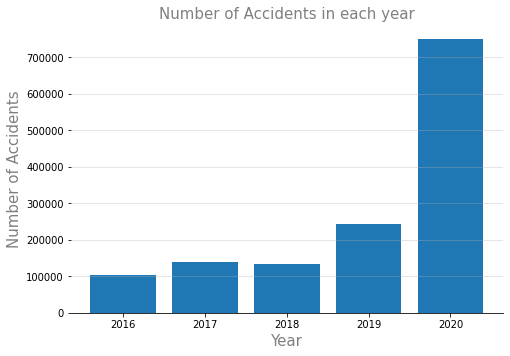

In [ ]:
#@title Number of Accidents in Each Year
#@markdown Bar Plot
year = pd.DataFrame(traffic_df_1['Start_Time_Year'].value_counts()).reset_index()
fig = plt.figure(figsize=(6, 4))
ax = fig.add_axes([0,0,1,1])
ax.spines[('top')].set_visible(False)
ax.spines[('right')].set_visible(False)
ax.spines[('left')].set_visible(False)
ax.bar(year['index'], year['Start_Time_Year'])
ax.set_ylabel('Number of Accidents', fontsize=15, color='grey')
ax.set_xlabel('Year', fontsize=15, color='grey')
ax.set_title('Number of Accidents in each year', fontsize=15, color='grey')
ax.grid(axis='y', linestyle='-', alpha=0.4) 
fig.show()

The number of accidents are increasing over years. There is an obvious increase during the year of **2020** than in **2019**. It might because there are more recorded cases, but the increasing trend is pronounced.

Which month of the year have more accidents?

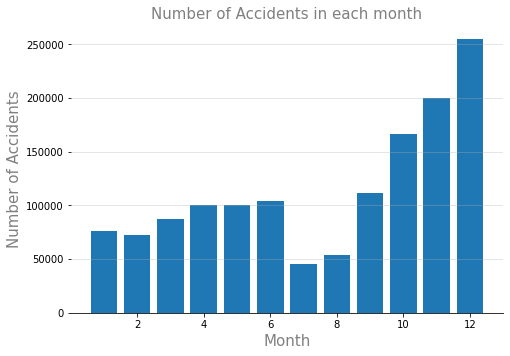

In [ ]:
#@title Number of accidents in Each Month
#@markdown Bar Plot
month = pd.DataFrame(traffic_df_1['Start_Time_Month'].value_counts()).reset_index()
fig = plt.figure(figsize=(6, 4))
ax = fig.add_axes([0,0,1,1])
ax.spines[('top')].set_visible(False)
ax.spines[('right')].set_visible(False)
ax.spines[('left')].set_visible(False)
ax.bar(month['index'], month['Start_Time_Month'])
ax.set_ylabel('Number of Accidents', fontsize=15, color='grey')
ax.set_xlabel('Month', fontsize=15, color='grey')
ax.set_title('Number of Accidents in each month', fontsize=15, color='grey')
ax.grid(axis='y', linestyle='-', alpha=0.4) 
fig.show()

The number of accidents is less in **summer (July and August)**, and more in **winter (November and December)**. This may caused by the worse weather conditions in winter.

Finally, which day of the week have high number of cases?

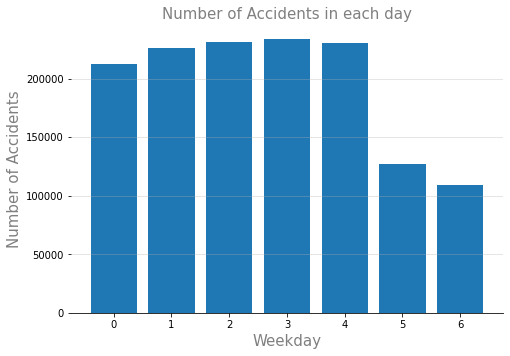

In [ ]:
#@title Number of accidents in each day of the week
#@markdown bar plot
day = pd.DataFrame(traffic_df_1['Start_Time_DayofWeek'].value_counts()).reset_index()
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.spines[('top')].set_visible(False)
ax.spines[('right')].set_visible(False)
ax.spines[('left')].set_visible(False)
ax.bar(day['index'], day['Start_Time_DayofWeek'])
ax.set_ylabel('Number of Accidents', fontsize=15, color='grey')
ax.set_xlabel('Weekday', fontsize=15, color='grey')
ax.set_title('Number of Accidents in each day', fontsize=15, color='grey')
ax.grid(axis='y', linestyle='-', alpha=0.4) 
fig.show()

From the bar plot, we can see that the number of accidents in the **workdays** are **twice** of which in the **weekends**. This is because people drving to work with lead to more cars on the road, and thus increase the chance of car accidents.

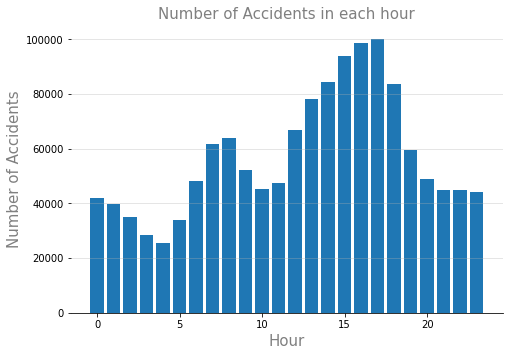

In [ ]:
#@title Number of Accidents in Each Hour of the Week
#@markdown Bar Plot
time = pd.DataFrame(traffic_df_1['Start_Time_Hour'].value_counts()).reset_index()
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.spines[('top')].set_visible(False)
ax.spines[('right')].set_visible(False)
ax.spines[('left')].set_visible(False)
ax.bar(time['index'], time['Start_Time_Hour'])
ax.set_ylabel('Number of Accidents', fontsize=15, color='grey')
ax.set_xlabel('Hour', fontsize=15, color='grey')
ax.set_title('Number of Accidents in each hour', fontsize=15, color='grey')
ax.grid(axis='y', linestyle='-', alpha=0.4) 
fig.show()

From the above plot, we can see that there are **three** peaks of acccidents in a day: **7-8 AM**, **16-17 PM**, **0 AM**. They are reasonable, 7-8 AM is when people go to work in the morning and 16-17 PM is when people go back home, so there are a large amount of vehicles on road, thus increase the probabilities of accidents. 0 AM is the time when people are very tired driving, which will leads to accidents.

### 2.3.4 Text Analysis

We notice that there's a column in our dataset called 'Description', which is a text column contains the information of each accident. What can we learn from these seemingly useless text? Let's take a look at our discription column.



In [ ]:
traffic_df_1[['Description']].head(5)

,Description
0,Between Sawmill Rd/Exit 20 and OH-315/Olentang...
1,At Mitchell Ave/Exit 6 - Accident.
2,At Dela Palma Rd - Accident.
3,At Dela Palma Rd - Accident.
4,At OH-4/Exit 54 - Accident.


First, we make a word cloud for the words in the Description column.

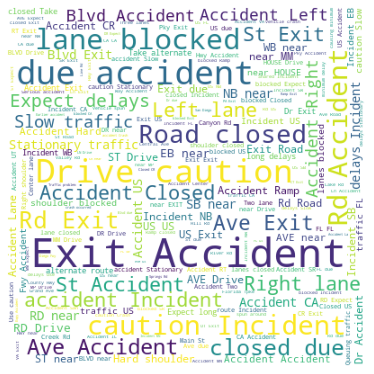

In [ ]:
#@title Words in the Description Column
#@markdown Word Cloud
text = ' '.join(traffic_df_1['Description'].to_list())
wordcloud = WordCloud(width = 400, height = 400, background_color = 'white', stopwords = STOPWORDS).generate(text)
fig = plt.figure(figsize = (5, 5))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


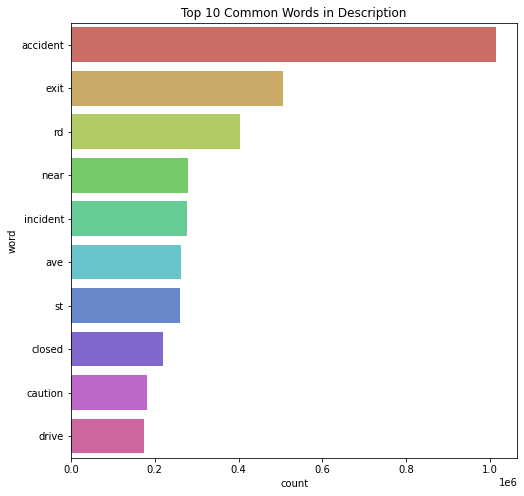

In [ ]:
import nltk
import spacy
import re
def remove_punc(x):
    return re.sub('[^A-Za-z]+', ' ', x).lower()
traffic_df_1['description'] = traffic_df_1['Description'].apply(remove_punc)

nlp = spacy.load("en_core_web_sm")
stopwords = nlp.Defaults.stop_words
nltk.download('punkt')
def remove_stopwords(x):
    tokens = nltk.tokenize.word_tokenize(x)
    tokens_no_stop = [y for y in tokens if y not in stopwords]
    return " ".join(tokens_no_stop)
traffic_df_1['description'] = traffic_df_1['description'].apply(remove_stopwords)
text = ""
for i in traffic_df_1['description']:
    text += " " + i
tokenized_text = nltk.tokenize.word_tokenize(text)
freq_dict = nltk.FreqDist(w for w in tokenized_text)
common = pd.DataFrame(freq_dict.most_common(10))
common.columns = ['word', 'count']
plt.figure(figsize=(8, 8))
sns.barplot(x="count", y="word", data=common, palette='hls')
plt.title('Top 10 Common Words in Description')
plt.show()

From the above frequency plot, the words like **accident**, **exit**, and **rd** occurs a lot. Let's figure out what proportion of rows contains these words.

In [ ]:
print(traffic_df_1['Description'].str.contains('Road|Rd|Ave|st').sum()/1370980 * 100 , '% of rows contains Road or Rd or Ave or st')
print(traffic_df_1['Description'].str.contains('Accident|Incident').sum()/1370980 * 100 , '% of rows contains Accidents or Incident')
print(traffic_df_1['Description'].str.contains('exit|Exit').sum()/1370980 * 100 , '% of rows contains exit')
print(traffic_df_1['Description'].str.contains('closed|Closed').sum()/1370980 * 100 , '% of rows contains closed')

41.024887306889966 % of rows contains Road or Rd or Ave or st
79.75098105005178 % of rows contains Accidents or Incident
29.426103954835227 % of rows contains exit
9.94099111584414 % of rows contains closed


These words may be useful in our models while predicting for the severity in the next section, so we turn the Description column into several columns of 0 and 1 which contains the information of the existence of some important words discussed above.

In [ ]:
traffic_df_1['Description1'] = traffic_df_1['Description'].str.contains('Road|Rd|Ave|st')
traffic_df_1['Description2'] = traffic_df_1['Description'].str.contains('Accident|Incident')
traffic_df_1['Description3'] = traffic_df_1['Description'].str.contains('exit|Exit')
traffic_df_1['Description4'] = traffic_df_1['Description'].str.contains('closed|Closed')
traffic_df_1

,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Street,Side,City,County,State,Zipcode,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Start_Time_Year,Start_Time_Month,Start_Time_Day,Start_Time_Hour,Start_Time_DayofWeek,Description1,Description2,Description3,Description4
0,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,Outerbelt E,R,Dublin,Franklin,OH,43017,US/Eastern,KOSU,2016-02-08 00:53:00,42.1,58.0,29.76,10.0,SW,10.4,Light Rain,0,0,0,0,0,0,0,0,0,0,0,0,0,Night,Night,Night,Night,2016,2,8,0,0,True,True,True,False
1,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500,At Mitchell Ave/Exit 6 - Accident.,I-75 S,R,Cincinnati,Hamilton,OH,45217,US/Eastern,KLUK,2016-02-08 07:53:00,37.0,93.0,29.69,10.0,WSW,10.4,Light Rain,0,0,0,0,0,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2016,2,8,7,0,True,True,True,False
2,2,2016-02-08 08:16:57,2016-02-08 14:16:57,39.063240,-84.032430,39.067310,-84.058510,1.427,At Dela Palma Rd - Accident.,State Route 32,R,Williamsburg,Clermont,OH,45176,US/Eastern,KI69,2016-02-08 08:16:00,35.6,100.0,29.66,10.0,WSW,8.1,Overcast,0,0,0,0,0,0,0,0,0,0,0,1,0,Day,Day,Day,Day,2016,2,8,8,0,True,True,False,False
3,2,2016-02-08 08:16:57,2016-02-08 14:16:57,39.067080,-84.058550,39.063020,-84.032540,1.423,At Dela Palma Rd - Accident.,State Route 32,R,Batavia,Clermont,OH,45103,US/Eastern,KI69,2016-02-08 08:16:00,35.6,100.0,29.66,10.0,WSW,8.1,Overcast,0,0,0,0,0,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2016,2,8,8,0,True,True,False,False
4,2,2016-02-08 08:15:41,2016-02-08 14:15:41,39.775650,-84.186030,39.772750,-84.188050,0.227,At OH-4/Exit 54 - Accident.,I-75 S,R,Dayton,Montgomery,OH,45404,US/Eastern,KFFO,2016-02-08 08:18:00,33.8,100.0,29.63,3.0,SW,2.3,Mostly Cloudy,0,0,0,0,0,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2016,2,8,8,0,False,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1370975,2,2019-08-23 18:03:25,2019-08-23 18:32:01,34.002480,-117.379360,33.998880,-117.370940,0.543,At Market St - Accident.,Pomona Fwy E,R,Riverside,Riverside,CA,92501,US/Pacific,KRAL,2019-08-23 17:53:00,86.0,40.0,28.92,10.0,W,13.0,Fair,0,0,0,0,0,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2019,8,23,18,4,False,True,False,False
1370976,2,2019-08-23 19:11:30,2019-08-23 19:38:23,32.766960,-117.148060,32.765550,-117.153630,0.338,At Camino Del Rio/Mission Center Rd - Accident.,I-8 W,R,San Diego,San Diego,CA,92108,US/Pacific,KMYF,2019-08-23 18:53:00,70.0,73.0,29.39,10.0,SW,6.0,Fair,0,0,0,0,0,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2019,8,23,19,4,True,True,False,False
1370977,2,2019-08-23 19:00:21,2019-08-23 19:28:49,33.775450,-117.847790,33.777400,-117.857270,0.561,At Glassell St/Grand Ave - Accident. in the ri...,Garden Grove Fwy,R,Orange,Orange,CA,92866,US/Pacific,KSNA,2019-08-23 18:53:00,73.0,64.0,29.74,10.0,SSW,10.0,Partly Cloudy,0,0,0,0,1,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2019,8,23,19,4,True,True,False,False
1370978,2,2019-08-23 19:00:21,2019-08-23 19:29:42,33.992460,-118.403020,33.983110,-118.395650,0.772,At CA-90/Marina Fwy/Jefferson Blvd - Accident.,San Diego Fwy S,R,Culver City,Los Angeles,CA,90230,US/Pacific,KSMO,2019-08-23 18:51:00,71.0,81.0,29.62,10.0,SW,8.0,Fair,0,0,0,0,0,0,0,0,0,0,0,0,0,Day,Day,Day,Day,2019,8,23,19,4,False,True,False,False


### 2.3.5 Multicolinearity Checking

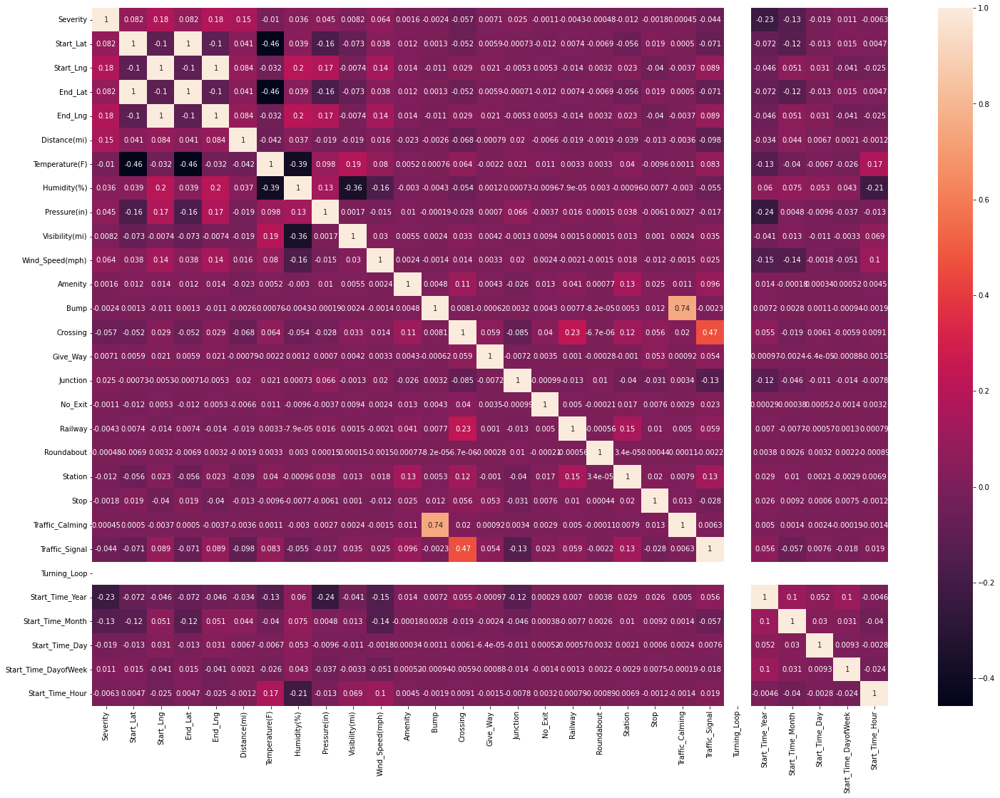

In [ ]:
corr_matrix = traffic_df_1.corr()

import seaborn as sn
import matplotlib.pyplot as plt

plt.figure(figsize=(25,18))
sn.heatmap(corr_matrix, annot=True)
plt.show()

First we noticed that there's a high correlation between Start_Lat and End_Lat, Start_Lng and End_Lng, which is reasonable since the Start location and End location should be very close. Therefore, we only need to consider either the Start location or the End location.

We've also seen a large positive correlation between Bump and Traffic_Calming, which is also a reasonable observation, since most traffic calming areas has some speed bumps on the road, and we only need to take one into consideration.

In the next section, we will use the data we've cleaned and processed above to make prediction models for the severity in an accident.

# 3. Modeling

## 3.1 Data Processing & Feature Engineering

In the moodeling part, the very first step to do is to continue process the dataset in order to make it suitable for training machine learning model. In this process, we first convert the categorical variables into labels.

Then we manually drop all the unnecessary features be based on our domian knowledges. After that, we divided the datasets into features and labels. Eventually, we set the training set and testing set. As part of feature engineering, we use data mining techinques to extract features from raw, clean datasets based on our domain knowledges & common sense in order to improve the performance of machine learning model.

### 3.1.1 Encode Categorical Variables

In here, there are 12 variables including **Side**, **City**, **County**, **State**, **Airport_Code**, **Wind_Direction**, **Weather_Conition**, **Sunrise_Sunset**, **Civil_Twilight**, **Nautical_Twilight**, **Astronomical_Twilight** and **Timezone**, which are categorical variables. We simply apply LabelEncoder from SKlearn to transfer these categorical features into lables.

In [ ]:

traffic_df_1[['Description1','Description2','Description3','Description4']] = (traffic_df_1[['Description1','Description2','Description3','Description4']]).astype(int)

In [ ]:
from sklearn.preprocessing import LabelEncoder

labelencoder = LabelEncoder()
s = labelencoder.fit_transform(traffic_df_1['Side'])

labelencoder = LabelEncoder()
c = labelencoder.fit_transform(traffic_df_1['City'])

labelencoder = LabelEncoder()
co = labelencoder.fit_transform(traffic_df_1['County'])


labelencoder = LabelEncoder()
st = labelencoder.fit_transform(traffic_df_1['State'])

labelencoder = LabelEncoder()
a = labelencoder.fit_transform(traffic_df_1['Airport_Code'])

labelencoder = LabelEncoder()
wd = labelencoder.fit_transform(traffic_df_1['Wind_Direction'])

labelencoder = LabelEncoder()
wc = labelencoder.fit_transform(traffic_df_1['Weather_Condition'])

labelencoder = LabelEncoder()
ss = labelencoder.fit_transform(traffic_df_1['Sunrise_Sunset'])

labelencoder = LabelEncoder()
ct = labelencoder.fit_transform(traffic_df_1['Civil_Twilight'])

labelencoder = LabelEncoder()
nt = labelencoder.fit_transform(traffic_df_1['Nautical_Twilight'])

labelencoder = LabelEncoder()
at = labelencoder.fit_transform(traffic_df_1['Astronomical_Twilight'])

labelencoder = LabelEncoder()
tz = labelencoder.fit_transform(traffic_df_1['Timezone'])


In here, there are 12 variables including **Side_labels**, **City_lables**, **County_labels**, **State_labels**, **Airport_Code_labels**, **Wind_Direction_labels**, **Weather_Conition_labels**, **Sunrise_Sunset_labels**, **Civil_Twilight_labels**, **Nautical_Twilight_labels**, **Astronomical_Twilight_labels** and **Timezone_lables** are our new labels.

In [ ]:
traffic_df_1['Side_labels'] = s
traffic_df_1['City_labels'] = c
traffic_df_1['County_labels'] = co
traffic_df_1['State_labels'] = st
traffic_df_1['Airport_Code_labels'] = a
traffic_df_1['Wind_Direction_labels'] = wd
traffic_df_1['Weather_Condition_labels'] = wc
traffic_df_1['Sunrise_Sunset_Condition_labels'] = ss
traffic_df_1['Civil_Twilight_labels'] = ct
traffic_df_1['Nautical_Twilight_labels'] = nt
traffic_df_1['Astronomical_Twilight_labels'] = at
traffic_df_1['Timezone_labels'] = tz

### 3.1.2 Split into Features & Label

The goal of our modeling building part is try to find a machine learning model that could predict the severity of a traffic accident be based on the key features.

In here, we considers to drop features that are not helpful for training our machine learning models. We drop **Zipcode** beacause it is highly correlated to the location features (**Start_Lat**, **Start_Lng**); we drop **Start_Time** and **End_Time** because we already break it down into Year, Month, Day, Time for prediction. We also drop some description variables such as **Description**, **side**, **Street** and etc. which are not useful for model tranining and have been represented/high correlated with other variables. Lastly, we drop categorical variables that has been transfer to labels.




In [ ]:
traffic_df_1.head(1)

,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Street,Side,City,County,State,Zipcode,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Start_Time_Year,Start_Time_Month,Start_Time_Day,Start_Time_Hour,Start_Time_DayofWeek,Description1,Description2,Description3,Description4,Side_labels,City_labels,County_labels,State_labels,Airport_Code_labels,Wind_Direction_labels,Weather_Condition_labels,Sunrise_Sunset_Condition_labels,Civil_Twilight_labels,Nautical_Twilight_labels,Astronomical_Twilight_labels,Timezone_labels
0,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.10891,-83.09286,40.11206,-83.03187,3.23,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,Outerbelt E,R,Dublin,Franklin,OH,43017,US/Eastern,KOSU,2016-02-08 00:53:00,42.1,58.0,29.76,10.0,SW,10.4,Light Rain,0,0,0,0,0,0,0,0,0,0,0,0,0,Night,Night,Night,Night,2016,2,8,0,0,1,1,1,0,1,2441,529,33,1412,15,50,1,1,1,1,1


As mentioned, the goal of the model training is to make predictions of Severity of traffic accdidents. In here, we simply break down the datasets into features and labels for training.



In [ ]:
features = traffic_df_1.drop(columns=['Zipcode','Start_Time', 'End_Time','Street','Weather_Timestamp','Severity','Side','City','County','State','Airport_Code','Wind_Direction','Weather_Condition','Sunrise_Sunset','Civil_Twilight','Nautical_Twilight','Astronomical_Twilight','Timezone','Description', 'End_Lat','End_Lng','Bump'])
labels = traffic_df_1[['Severity']]

In [ ]:
features

,Start_Lat,Start_Lng,Distance(mi),Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Amenity,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Start_Time_Year,Start_Time_Month,Start_Time_Day,Start_Time_Hour,Start_Time_DayofWeek,Description1,Description2,Description3,Description4,Side_labels,City_labels,County_labels,State_labels,Airport_Code_labels,Wind_Direction_labels,Weather_Condition_labels,Sunrise_Sunset_Condition_labels,Civil_Twilight_labels,Nautical_Twilight_labels,Astronomical_Twilight_labels,Timezone_labels
0,40.108910,-83.092860,3.230,42.1,58.0,29.76,10.0,10.4,0,0,0,0,0,0,0,0,0,0,0,0,2016,2,8,0,0,1,1,1,0,1,2441,529,33,1412,15,50,1,1,1,1,1
1,39.172393,-84.492792,0.500,37.0,93.0,29.69,10.0,10.4,0,0,0,0,0,0,0,0,0,0,0,0,2016,2,8,7,0,1,1,1,0,1,1650,631,33,1115,21,50,0,0,0,0,1
2,39.063240,-84.032430,1.427,35.6,100.0,29.66,10.0,8.1,0,0,0,0,0,0,0,0,0,0,1,0,2016,2,8,8,0,1,1,0,0,1,9987,315,33,930,21,72,0,0,0,0,1
3,39.067080,-84.058550,1.423,35.6,100.0,29.66,10.0,8.1,0,0,0,0,0,0,0,0,0,0,0,0,2016,2,8,8,0,1,1,0,0,1,486,315,33,930,21,72,0,0,0,0,1
4,39.775650,-84.186030,0.227,33.8,100.0,29.63,3.0,2.3,0,0,0,0,0,0,0,0,0,0,0,0,2016,2,8,8,0,0,1,1,0,1,2204,997,33,678,15,69,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1370975,34.002480,-117.379360,0.543,86.0,40.0,28.92,10.0,13.0,0,0,0,0,0,0,0,0,0,0,0,0,2019,8,23,18,4,0,1,0,0,1,7734,1248,3,1540,19,12,0,0,0,0,3
1370976,32.766960,-117.148060,0.338,70.0,73.0,29.39,10.0,6.0,0,0,0,0,0,0,0,0,0,0,0,0,2019,8,23,19,4,1,1,0,0,1,8065,1300,3,1292,15,12,0,0,0,0,3
1370977,33.775450,-117.847790,0.561,73.0,64.0,29.74,10.0,10.0,0,0,0,1,0,0,0,0,0,0,0,0,2019,8,23,19,4,1,1,0,0,1,6770,1092,3,1705,14,74,0,0,0,0,3
1370978,33.992460,-118.403020,0.772,71.0,81.0,29.62,10.0,8.0,0,0,0,0,0,0,0,0,0,0,0,0,2019,8,23,19,4,0,1,0,0,1,2103,864,3,1700,15,12,0,0,0,0,3


In [ ]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1370980 entries, 0 to 1370979
Data columns (total 41 columns):
 #   Column                           Non-Null Count    Dtype  
---  ------                           --------------    -----  
 0   Start_Lat                        1370980 non-null  float64
 1   Start_Lng                        1370980 non-null  float64
 2   Distance(mi)                     1370980 non-null  float64
 3   Temperature(F)                   1370980 non-null  float64
 4   Humidity(%)                      1370980 non-null  float64
 5   Pressure(in)                     1370980 non-null  float64
 6   Visibility(mi)                   1370980 non-null  float64
 7   Wind_Speed(mph)                  1370980 non-null  float64
 8   Amenity                          1370980 non-null  int64  
 9   Crossing                         1370980 non-null  int64  
 10  Give_Way                         1370980 non-null  int64  
 11  Junction                         1370980 non-null 

### 3.1.3 Split Data into Train and Test

Before training the model, we need to split the dataset into "training" and "testing". We use 70-30 here, which means 70% of dataset for trainng and 30% for testing. We store our result into x_train, x_test, y_train, and y_test.

To be notice, we try 80-20 test spliting at the first stage, but we noticed that 70-30 generate better results from various models for our dataset. 


In [ ]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(features,labels, test_size=0.3, random_state=42)

### 3.1.4 Standardization

Since we are planning to apply PCA, K-means clustering and logistic regression with regularization and these model are affected by the vauler ange of features, we need to standardization x_train and x_test via standardscaler using the z-score.

We import preprocessing package from sklearn and transfrom the x_train and x_test by standardscalr.


In [ ]:
from sklearn import preprocessing
scaler=preprocessing.StandardScaler()
x_train=scaler.fit_transform(x_train)
x_test=scaler.transform(x_test)


## 3.2 Taining Machine Learning Models:

In our modeling building part, we will start with unsupervised models including PCA and k-mean modele in order to help us reduce the noise of data, solve multicolinearity problmes and learn better about the dataset.

Then we will run a series of supervised machine learning model. The goal of our project is to prediction the severity of traffic accident at different level be based on a series of key feautes. Therefore, it is more reasonable to run classication model. We will start with some baseline models such as Navies Bayes, decision trees, random forest and logistic regression to see which one generate better result. Then we will stack the models that generate better result togehter and see whether we could conitune improve our model's accuarcy.

### 3.2.1 PCA for Diemsionality Reduction

We start with unsupervised machine learning model to ,firstly, help us learn better about the dataset. Second, we want to shrink the number of features for training supervised machine learning model to improve the overall accuracies of models.

Principal component analysis is a popular way to reduce the number of dumensions/features in the dataset. It is a method that make a"n rows * p columns" dataset into a "n rows * k columns" dataset. It is very helpful since it can reduce the noise in the data for supervised learning, reduces number of data and very simple to visualize.

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

sc = StandardScaler()
sc.fit(x_train)
x_train_std = sc.transform(x_train)
x_test_std = sc.transform(x_test)

from numpy.linalg import eigh
cov_matrix = np.cov(x_train_std, rowvar=False)
egnvalues, egnvectors = eigh(cov_matrix)
total_egnvalues = sum(egnvalues)
var_exp = [(i/total_egnvalues) for i in sorted(egnvalues, reverse=True)]

**Some ideas behind PCA:**

    Step 1: compute the variance of column a (X(a)). And we continue to generate variance from column 1<=a<=p to get a variance matrix

	
	Step 2: Define covariance to capture how the dimensions vary from the mean with respect to each other 

	Step3: Compute the eigenvectors and eigenvalues for the covariance matrix 

	Step4: Sort the eigenvectors from highest to lowest, pick the top k column which is <= p

	Step5: Construct a projection matrix W from these k eigenvectors 

	Step6: Transform original dataset X by multiplying W and obtain a k-dimensional feature subspace Y


After training the PCA, we calculate the explained variance, plot the explauined vatiance over the number of components in the data to choose the best number of components for PCA.

In [ ]:
explained_variance = var_exp
print(explained_variance)

[0.11128384426745555, 0.06700620776527838, 0.05117905794868963, 0.042901940814682765, 0.0416517124866789, 0.03725503322373121, 0.03537599762961826, 0.03266424303613491, 0.02832985238650175, 0.026561115842770214, 0.02638594676157914, 0.025807623712176844, 0.025100816322862384, 0.025020254807107147, 0.024917789045393792, 0.02478275621578864, 0.024325872423313563, 0.024118617707579896, 0.023565941195747463, 0.022828457583278, 0.02279533441233423, 0.02202060774679747, 0.021228346197328857, 0.02053249832045937, 0.02011709008099736, 0.019706895813268777, 0.018055342091042554, 0.017076506574664165, 0.0165641720342095, 0.016003160373726417, 0.014901064705460865, 0.014502607413331179, 0.012064807356733032, 0.01143924232503033, 0.010105976260302869, 0.007925209843894143, 0.0065154317663845196, 0.004013445003752694, 0.0020692932764483567, 0.0012998872274649108, 6.209593365761279e-18]


In [ ]:
pca = PCA(n_components=len(x_train_std[0]))
pca.fit(x_train_std)
x_train = pca.transform(x_train_std)
x_test = pca.transform(x_test_std)

Be based on our plot, the best number of components is around 31.

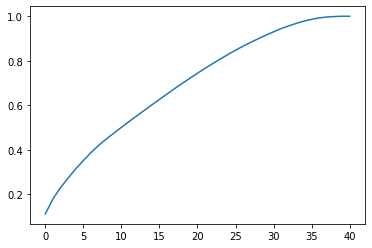

In [ ]:
pc_vs_variance = np.cumsum(pca.explained_variance_ratio_)
pc_vs_variance

plt.plot(pc_vs_variance)

We apply PCA model with new number of components (31) into our original training and testing dataset. We save the new training and testing data as **x_train_pca** and **x_test_pca**.

In [ ]:
pca = PCA(n_components=36)
pca.fit(x_train_std)
x_train_pca = pca.transform(x_train_std)
x_test_pca = pca.transform(x_test_std)

### 3.2.2 K-means Clustering


Another type of common unsupervised machine learning model is clustering. Clustering seeks to find “natural groupings” in data based on distance. (Clustering coefficient rely on distance measure). K-means clustering it a type of clustering that will iterate until convergence.

**Basic Idea**: 

	Step1: For each of k clusters, pick a centroid for the cluster (randomly)

	Step2: After getting centroids, we assign each point to the cluster associated with the nearest centroid.
  
	Step3: For step2, some are very close to the centroid but some are very far away. Therefore, we continue to iterate until the whole thing converges.


In here, we start with set up a bound **max_k = 10** to determine how long it run. We also want to try different values for k and to see how well the clusters fit the data. We use distortion, which is square error of distances as the key measurement for us to determine the best number of k. We pick k that minimize distortion.

We then plot te distortion against number of k. On this graph, we use the "elbow method" and determine that **k = 4** is the best K since distortion after k = 5 may not make a huge difference.

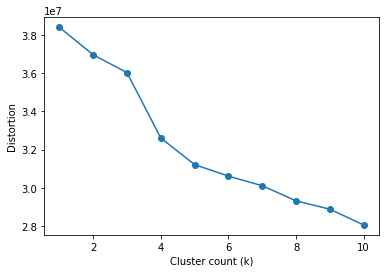

In [ ]:
from sklearn.cluster import KMeans
distortions = []

max_k = 10
for i in range(1,max_k+1):
  km = KMeans(n_clusters=i,
              init='random',
              n_init=1,
              max_iter=300,
              random_state=0)
  km.fit(x_train)
  # The distortion is called inertia in SciKit
  distortions.append(km.inertia_)

plt.plot(range(1,max_k+1), distortions, marker='o')
plt.xlabel('Cluster count (k)')
plt.ylabel('Distortion')
plt.show()

We re-train our k-mean model by using number of cluster equal to four. And then we visualize our result below. The graph divided our date set into four different clusters.

In [ ]:
from sklearn.cluster import KMeans

km = KMeans(n_clusters=4, random_state=0) 
km.fit(x_train)

KMeans(n_clusters=4, random_state=0)

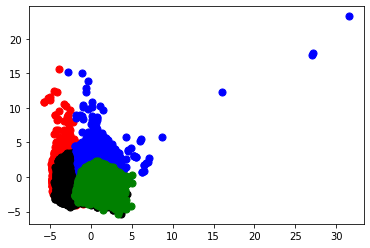

In [ ]:
clust0 = np.array([x for i, x in enumerate(x_train) if km.labels_[i] == 0])
clust1 = np.array([x for i, x in enumerate(x_train) if km.labels_[i] == 1])
clust2 = np.array([x for i, x in enumerate(x_train) if km.labels_[i] == 2])
clust3 = np.array([x for i, x in enumerate(x_train) if km.labels_[i] == 3])



plt.scatter(clust0[:,0], clust0[:,1], c='red', marker='o', s=50)
plt.scatter(clust1[:,0], clust1[:,1], c='black', marker='o', s=50)
plt.scatter(clust2[:,0], clust2[:,1], c='blue', marker='o', s=50)
plt.scatter(clust3[:,0], clust3[:,1], c='green', marker='o', s=50)


### 3.2.3 Navies Bayes Classifier

After PCA Dimesionality reduction, we try several different machine learning methods to see which one works well.

We start with Navies Bayes Classifier since it is a simple model that train very fast. We import GaussianNB package from sklearn, initialzie the model without changing parameters, train the dataset and save our result in **y_pred**.

#### 3.2.3.1 Navies Bayes Classifier Without PCA

We start with running Navies Bayes Classifier by original training/testing data without PCA. We get a accruacy rate around 79.0391%.

In [ ]:
from sklearn.naive_bayes import GaussianNB


gnb = GaussianNB()
y_pred = gnb.fit(x_train, y_train).predict(x_test)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [ ]:
from sklearn.metrics import accuracy_score
naive_bayes_acc= accuracy_score(y_test, y_pred)
print(naive_bayes_acc)

0.7903908153291805


#### 3.2.3.2 Navies Bayes Classifier With PCA

We then Navies Bayes Classifier by new training/testing data with PCA. We get a accruacy rate around 79.7007%, which is slightly higher than the one without PCA. This could indicate that using PCA in our case led to a better result. We could consider apply PCA dataset for the future.

In [ ]:
gnb = GaussianNB()
y_pred_pca = gnb.fit(x_train_pca, y_train).predict(x_test_pca)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [ ]:
naive_bayes_acc_pca= accuracy_score(y_test, y_pred_pca)
print(naive_bayes_acc_pca)

0.7970065208828722


### 3.2.4 Trees


Tree based model is another popular machine leaarning for classification problem. A Decision tree is a flowchart that deciding whether an item belong to a class. Each intermediate/split evaluate one or more predicates.Split dataset based on whether it satisfies the predictsleaf -level nodes will be associated with classes, based on the majority-label


#### 3.2.4.1 Decision Tree

We use **tree** pacakge from sklearn to train the decision tree model. We first start with trainin the decision tree by using train/test data without PCA. It generate a result with accuracy rate arround 84.7618%.

In [ ]:
from sklearn import tree

clf_tree = tree.DecisionTreeClassifier()
clf = clf_tree.fit(x_train,y_train)

prediction_tree = clf.predict(x_test)


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_tree = accuracy_score(prediction_tree,y_test)
print(accuracy_tree)

0.8476175193413957


We train another decision tree model by training it with data with PCA. It generate an accuracy rate that is about 84.4178%, whcih is slightly lower than the one without PCA. This could explained by PCA filter some important features that could provide useful inforamtions for classification model and decision trees model are scale-invariant.

In [ ]:
from sklearn import tree

clf_tree = tree.DecisionTreeClassifier()
clf = clf_tree.fit(x_train_pca,y_train)

prediction_tree = clf.predict(x_test_pca)

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_tree = accuracy_score(prediction_tree,y_test)
print(accuracy_tree)

0.8441771579454113


#### 3.2.4.2 Random Forest

Random forest model is basicalky ensembles of decision tree. It's basic idea is that we draw a random boostrap data sample od sizen, with replacement ("bagging"). Then the model build a tiny decision tree and reapt this process k times. For prediction, it will use majority vote to predict a class for new data.

In here, we import RandomForestClassifier package from sklearn. We tune the hyberparameters "number of estimators", the number of trees we build, of our model from 10 to 100 and find that it genertae the best accuracy rate when n_estimaors = 100. The accuracy rate of our model is 86.8688%

In [ ]:
from sklearn.ensemble import RandomForestClassifier
clf_rf = RandomForestClassifier(max_depth=10, random_state=42, n_estimators=100)
clf_rf = clf_rf.fit(x_train, y_train)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [ ]:
prediction_forest = clf_rf.predict(x_test)

In [ ]:

from sklearn.model_selection import train_test_split
import sklearn.metrics
test_accuracy = sklearn.metrics.accuracy_score(prediction_forest,y_test)
print(test_accuracy)

0.8686876054598414


### 3.2.5 Logistic Regression Classifier


Next, we will try logistic regression classifier. It is another very classic machine learning model. We will try to run train logistic regression under different setting including standard logistic regression, logistic regression with reguarlization and logistic regression train after PCA.

#### 3.2.5.1 Logistic Regression

We first start with running the logistic regression by import its package from sklearn. We save our result to **prediction**. We train our model by using LogisticRegression() function and set the max_iter = 10000 to lower the amount of time for training. This model generate an accuracy rate that is about 86.2758%, which is very close to that of random forest model.

In [ ]:
from sklearn.linear_model import LogisticRegression


clf = LogisticRegression(max_iter=10000)
clf.fit(x_train,y_train)
prediction = clf.predict(x_test)



/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [ ]:
import sklearn.metrics
test_accuracy = sklearn.metrics.accuracy_score(prediction,y_test)
print(test_accuracy)

0.8627575408345368


#### 3.2.5.2Logistic Regression with Reguarlization

Then we add reguarlization to logistic regression model to see whether we could further improve the accuracy of model.

We first start with Lasso. This is a penalty that based on sum of the weights. Under this method, it pushes weights toward zero if the feature do not have a significant effect on error. To do so, we set our penalty = "l1", solver = "liblinear" since we run for L1 and set the random_state =42. 

In [ ]:
#l1
from sklearn.linear_model import LogisticRegression
clf_l1 = LogisticRegression(
    penalty="l1",
    solver="liblinear",
    max_iter=10000,
    random_state = 42
)

In [ ]:
clf_l1.fit(x_train,y_train)
prediction_l1 = clf_l1.predict(x_test)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



The accuracy of logistic regression model with Lasso is 85.9427%, which  is slightly lower than the one without reguarlization. There are some reasons lead to a result like that. Adding penalty/reguarlization like introducing bias into the model. However, high bias may lead to an underfitting. Also since there are not serious muliticolinearity issues in our dataset, l1 may not able to improve the accruracy.

In [ ]:
test_accuracy_l1 = sklearn.metrics.accuracy_score(prediction_l1,y_test)
print(test_accuracy_l1)

0.8594265902249972


We then try the Ridge (L2) reguarlization to see if there're any difference. This is a penalty that try to minimize sum of square of the weights. This method work well when there are many large parameters abd multicollinearity. To do so, we set our penalty = "l2", solver = "liblinear" since we run for L2 and set the random_state =42.

The accruacy of the logistic regression model with L2 penalty is the same as the one  wit L1 penalty. In this case, we may consider that reguarlization is not an efficient method for our dataset.

In [ ]:
#l2
from sklearn.linear_model import LogisticRegression
clf_l2 = LogisticRegression(
    penalty="l2",
    solver="liblinear",
    max_iter=10000,
    random_state = 42
)

In [ ]:
clf_l2.fit(x_train,y_train)
prediction_l2 = clf_l2.predict(x_test)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [ ]:
from sklearn.metrics import accuracy_score
import sklearn.metrics 
test_accuracy_l2 = sklearn.metrics.accuracy_score(prediction_l2,y_test)
print(test_accuracy_l2)

0.8594265902249972


Lastly, we try to apply elasticnet as the third logistic regression with reguarkization. By applying elasticnet, we enjoy the benfits of both L1 and L2 reguarlization. It generate a result of 86.2767%, which is almost the same as the logistic regression without regualrization. This show that reguarlization is not neccessary for our dataset.


In [ ]:
#l1+l2
from sklearn.linear_model import LogisticRegression
clf_e = LogisticRegression(
    penalty="elasticnet",
    solver="saga",
    max_iter=10000,
    random_state = 42,
    l1_ratio=0.2
)

In [ ]:
clf_e.fit(x_train,y_train)
prediction_e = clf_e.predict(x_test)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [ ]:
from sklearn.metrics import accuracy_score
import sklearn.metrics 
test_accuracy_e = accuracy_score(prediction_e,y_test)
print(test_accuracy_e)

0.8627672662377763


#### 3.2.5.3Logistic Regression with PCA Dimesionality Reduction

Here, we re-train our logistic regression model using the same method as before. The only thing we do is just replace the x_train, x_test by training/testing data after PCA.

The result generate by this model is about 86.2070% of accuracy, which is very close to the one without PCA. This shows that our dataset might not have issues with noises and multicolinearity.

In [ ]:
from sklearn.linear_model import LogisticRegression


clf_pca = LogisticRegression(max_iter=10000)
clf_pca.fit(x_train_pca,y_train)




/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



LogisticRegression(max_iter=10000)

In [ ]:
prediction_pca = clf_pca.predict(x_test_pca)

In [ ]:
import sklearn.metrics
test_accuracy_pca = sklearn.metrics.accuracy_score(prediction_pca,y_test)
print(test_accuracy_pca)

0.86206946855534


#### 3.2.5.4 Learning Curve of Logistic Regression



### 3.2.6 Stacking


After trying different classification model, we can see that logistic regression and random forest model generate better results. We want to see how the model will performce if we stack them together.

The idea of stacking is pretty simple: we ensemble multiple classifier and use majority vote to pick. In here, we import stacking classifier from sklearn. We set the random forest as estimators and set its number of estimators equal to 10. Then we use stackingclassifier function and use logistic regression with same setting as before as our final estimator.

To be noticed, we try to run n_estimators =100 at first. However, its accruacy rate is slightly lower than the one with n_estimators = 10 and it takes much longer of time to train the model.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import StackingClassifier
estimators = [
    ('rf', RandomForestClassifier(random_state=42, n_estimators=10)),
]
clf = StackingClassifier(
    estimators=estimators, final_estimator=LogisticRegression(max_iter=10000)
)

In [ ]:
st = clf.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [ ]:
prediction_st = st.predict(x_test)

Eventually, the stacking model generate an accuracy rate of 89.1705%, which is higher than all our previous model. This indicate that stacking classifier is an useful strategy for our dataset for building a better model.

In [ ]:
from sklearn.model_selection import train_test_split
import sklearn.metrics
test_accuracy = sklearn.metrics.accuracy_score(prediction_st,y_test)
print(test_accuracy)

0.8917052035770033


# 4. Challenges/ Obstacles Faced

In the 'Description' column, the text are especially irregular. There are no rules in writing the descriptions of an accident, so it's relatively hard to extract infromation from that column. However, through counting the frequency of words, we focus on the most popular words, and successfully use one-hot encoding to represent the 'Description' column.

In the 'severity' column, there are much more category 2 than other categories, so this might be a cause of low accuracy in our model.

# 5. Potential Next Steps/ Future Direction

For the time analysis, we might take further look at the difference between the number of accidents in different years. Although the number of records might be different, we can focus on the change of proportions of accidents on each day in a week for different years.

Meanwhile, we didn't focus too much on analyzing the wheather conditions and traffic environment. It's easy to predict that traffic accidents tend to happen in rainy and snowy days, where the signs are less conspicuous. This may be validated in future analysis.

For the city analysis, we only focus on the accidents in Philadelphia. As our potential next step, we will analyze more cities like New Tork, Los Angelas, which might be interesting to see the similarity and difference between these cities.

Finally, like we mentioned above, the imbalance of severity may be a cause of unsatisfied training results. Therefore, it's reasonable to consider downsampling the rows with severity 2 or upsampling those with severity 1 to further improve the performance of the training models.

In the furture, we may need to put more effort on improving the accuracy rate of the model. Beside the method above, we might try Max-Min method as another way to standarlized our dataset. We also want to try other machine learning models such as SVM, Neural Network and etc. to see if we could further improve our performance. At the same time, if we have enough time, we want to play search grid for random forest models to see if we could tune the hyperparameters and find a even better random forest model. We could also consider adding more classifers  in the stacking classification model to improve the accuracy rate.